# Installing Dependencies

In [1]:
!pip install torchmetrics -q --upgrade nltk

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.5/1.5 MB 29.3 MB/s eta 0:00:00
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
preprocessing 0.1.13 requires nltk==3.2.4, but you have nltk 3.9.1 which is incompatible.


# Importing Libraries

In [2]:
# For loading the data
import os
from google.colab import userdata
from zipfile import ZipFile

# For getting data in the right format
import pandas as pd

# For finding vocabulary of textual data
import spacy
from collections import Counter

# For viewing and preprocessing images
from PIL import Image

# For Dataset and Data Loading
import torch
from torch.utils.data import DataLoader, Dataset
from torchvision import transforms
from torch.nn.utils.rnn import pad_sequence

# For train test split of data
import shutil
from sklearn.model_selection import train_test_split

# For plotting images
import matplotlib.pyplot as plt

# For model architecture
import torch.nn as nn
import torchvision.models as models
import torch.optim as optim

# For training loop
from tqdm import tqdm
from torchmetrics.text import BLEUScore, ROUGEScore

In [3]:
import os
import nltk

# Try user's home directory instead
home = os.path.expanduser("~")
nltk.download('punkt', download_dir=os.path.join(home, 'nltk_data'))

# Add this path to NLTK's search paths
nltk.data.path.append(os.path.join(home, 'nltk_data'))

[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Unzipping tokenizers/punkt.zip.


# Loading the Dataset

In [4]:
data_path = "/kaggle/input/flickr8k"
caption_file = data_path + '/captions.txt'
df = pd.read_csv(caption_file)
print("No. of (Image, Caption) pairs: ", len(df))
df.head(10)

No. of (Image, Caption) pairs:  40455


,image,caption
0,1000268201_693b08cb0e.jpg,A child in a pink dress is climbing up a set o...
1,1000268201_693b08cb0e.jpg,A girl going into a wooden building .
2,1000268201_693b08cb0e.jpg,A little girl climbing into a wooden playhouse .
3,1000268201_693b08cb0e.jpg,A little girl climbing the stairs to her playh...
4,1000268201_693b08cb0e.jpg,A little girl in a pink dress going into a woo...
5,1001773457_577c3a7d70.jpg,A black dog and a spotted dog are fighting
6,1001773457_577c3a7d70.jpg,A black dog and a tri-colored dog playing with...
7,1001773457_577c3a7d70.jpg,A black dog and a white dog with brown spots a...
8,1001773457_577c3a7d70.jpg,Two dogs of different breeds looking at each o...
9,1001773457_577c3a7d70.jpg,Two dogs on pavement moving toward each other .


**As we can see here, our dataset has for every image, 5 different captions**

# Data Preprocessing

In [5]:
spacy_eng = spacy.load("en_core_web_sm")

# Spacy tokenization example
text = "Skill Assessment Model: Validates and assesses skills from resumes, certifications, or projects. This resume parsing is done in a 2 step process - Performs OCR on user's resume to extract text, then uses Groq models to extract user data in json format for storage in database and user profile creation"
print([token.text.lower() for token in spacy_eng.tokenizer(text)])

['skill', 'assessment', 'model', ':', 'validates', 'and', 'assesses', 'skills', 'from', 'resumes', ',', 'certifications', ',', 'or', 'projects', '.', 'this', 'resume', 'parsing', 'is', 'done', 'in', 'a', '2', 'step', 'process', '-', 'performs', 'ocr', 'on', 'user', "'s", 'resume', 'to', 'extract', 'text', ',', 'then', 'uses', 'groq', 'models', 'to', 'extract', 'user', 'data', 'in', 'json', 'format', 'for', 'storage', 'in', 'database', 'and', 'user', 'profile', 'creation']


## Vocabulary Class

In [6]:
class Vocabulary:
  def __init__(self, min_freq):
    # Making a dictionary that maps integers to tokens
    # Adding the pre-defined special tokens
    self.int_to_str = {0:"<PAD>",1:"<SOS>",2:"<EOS>",3:"<UNK>"}

    # Making the reverse dictionary as well
    self.str_to_int = {v:k for k, v in self.int_to_str.items()}

    # Minimum no. of occurances a word needs to have to add it in vocabulary
    self.freq_threshold = min_freq

  def __len__(self):
    """Returns the length of the vocabulary"""
    return len(self.int_to_str)

  def tokenize_text(self, text):
    """Tokenizes a body of text"""
    return [token.text.lower() for token in spacy_eng.tokenizer(text)]

  def build_vocab(self, sentence_list):
    """Builds the vocabulary for a list of sentences"""
    frequencies = Counter()
    idx = 4  # indices 0-3 were already filled by the special tokens before

    for sentence in sentence_list:
      for word in self.tokenize_text(sentence):
        frequencies[word] += 1

        # Adding the word to the vocabulary
        if frequencies[word] == self.freq_threshold:
          self.str_to_int[word] = idx
          self.int_to_str[idx] = word
          idx += 1

  def numericalize(self, text):
    """Returns a list of indices of each token from input text in vocab"""
    tokenized_text = self.tokenize_text(text)
    return [self.str_to_int[token] if token in self.str_to_int else self.str_to_int["<UNK>"] for token in tokenized_text]

In [7]:
# Testing the vocabulary class
vocab = Vocabulary(min_freq=1)
vocab.build_vocab([text])
print(text)
print(vocab.str_to_int)
print(vocab.numericalize(text))

Skill Assessment Model: Validates and assesses skills from resumes, certifications, or projects. This resume parsing is done in a 2 step process - Performs OCR on user's resume to extract text, then uses Groq models to extract user data in json format for storage in database and user profile creation
{'<PAD>': 0, '<SOS>': 1, '<EOS>': 2, '<UNK>': 3, 'skill': 4, 'assessment': 5, 'model': 6, ':': 7, 'validates': 8, 'and': 9, 'assesses': 10, 'skills': 11, 'from': 12, 'resumes': 13, ',': 14, 'certifications': 15, 'or': 16, 'projects': 17, '.': 18, 'this': 19, 'resume': 20, 'parsing': 21, 'is': 22, 'done': 23, 'in': 24, 'a': 25, '2': 26, 'step': 27, 'process': 28, '-': 29, 'performs': 30, 'ocr': 31, 'on': 32, 'user': 33, "'s": 34, 'to': 35, 'extract': 36, 'text': 37, 'then': 38, 'uses': 39, 'groq': 40, 'models': 41, 'data': 42, 'json': 43, 'format': 44, 'for': 45, 'storage': 46, 'database': 47, 'profile': 48, 'creation': 49}
[4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 14, 16, 17, 18, 19, 20, 

## Dataset Class

In [8]:
class FlickrDataset(Dataset):
  """
  FlickrDataset
  """
  def __init__(self, root_dir, captions_file, transform=None, freq_threshold=5):
    self.root_dir = root_dir
    self.df = pd.read_csv(captions_file)
    self.transform=transform

    self.imgs=self.df['image']
    self.captions=self.df['caption']

    self.vocab = Vocabulary(min_freq=freq_threshold)
    self.vocab.build_vocab(self.captions.to_list())

  def __len__(self):
    """Returns the no. of (image, caption) pairs"""
    return len(self.df)

  def __getitem__(self, idx):
    """Returns the img and caption at given idx"""
    caption = self.captions[idx]
    img_name = self.imgs[idx]
    img_location = os.path.join(self.root_dir, img_name)
    img = Image.open(img_location).convert("RGB")

    if self.transform is not None:
      img = self.transform(img)

    caption_vec = []
    caption_vec += [self.vocab.str_to_int["<SOS>"]]
    caption_vec += self.vocab.numericalize(caption)
    caption_vec += [self.vocab.str_to_int["<EOS>"]]

    return img, torch.tensor(caption_vec)

In [9]:
img_transforms = transforms.Compose([
    transforms.Resize((224, 224)),  # For ResNet 50
    transforms.ToTensor()
])

# Train Test split

In [10]:
caption_file = os.path.join(data_path, "captions.txt" )
df = pd.read_csv(caption_file)
df

,image,caption
0,1000268201_693b08cb0e.jpg,A child in a pink dress is climbing up a set o...
1,1000268201_693b08cb0e.jpg,A girl going into a wooden building .
2,1000268201_693b08cb0e.jpg,A little girl climbing into a wooden playhouse .
3,1000268201_693b08cb0e.jpg,A little girl climbing the stairs to her playh...
4,1000268201_693b08cb0e.jpg,A little girl in a pink dress going into a woo...
...,...,...
40450,997722733_0cb5439472.jpg,A man in a pink shirt climbs a rock face
40451,997722733_0cb5439472.jpg,A man is rock climbing high in the air .
40452,997722733_0cb5439472.jpg,A person in a red shirt climbing up a rock fac...
40453,997722733_0cb5439472.jpg,A rock climber in a red shirt .


In [11]:
unique_images = df['image'].unique()
train_images, test_images = train_test_split(unique_images, test_size=0.2, shuffle=True, random_state=42)

In [12]:
len(unique_images)

8091

In [13]:
len(train_images), train_images

(6472,
 array(['3393152604_27bd1037f2.jpg', '3549673305_4dfd44e04a.jpg',
        '3181328245_7c04ce1691.jpg', ..., '2050067751_22d2763fd2.jpg',
        '518610439_b64ab21c02.jpg', '432496659_f01464d9fb.jpg'],
       dtype=object))

In [14]:
len(test_images), test_images

(1619,
 array(['3139895886_5a6d495b13.jpg', '3133825703_359a0c414d.jpg',
        '244910177_7c4ec3f65b.jpg', ..., '3198247669_7493af04a7.jpg',
        '253762507_9c3356c2f6.jpg', '3547704737_57d42d5d9d.jpg'],
       dtype=object))

In [15]:
train_df = df[df['image'].isin(train_images)]
test_df = df[df['image'].isin(test_images)]

In [16]:
train_df

,image,caption
0,1000268201_693b08cb0e.jpg,A child in a pink dress is climbing up a set o...
1,1000268201_693b08cb0e.jpg,A girl going into a wooden building .
2,1000268201_693b08cb0e.jpg,A little girl climbing into a wooden playhouse .
3,1000268201_693b08cb0e.jpg,A little girl climbing the stairs to her playh...
4,1000268201_693b08cb0e.jpg,A little girl in a pink dress going into a woo...
...,...,...
40440,99679241_adc853a5c0.jpg,A grey bird stands majestically on a beach whi...
40441,99679241_adc853a5c0.jpg,A large bird stands in the water on the beach .
40442,99679241_adc853a5c0.jpg,A tall bird is standing on the sand beside the...
40443,99679241_adc853a5c0.jpg,A water bird standing at the ocean 's edge .


In [17]:
test_df

,image,caption
85,1022454428_b6b660a67b.jpg,"A couple and an infant , being held by the mal..."
86,1022454428_b6b660a67b.jpg,A couple sit on the grass with a baby and stro...
87,1022454428_b6b660a67b.jpg,A couple with their newborn baby sitting under...
88,1022454428_b6b660a67b.jpg,A man and woman care for an infant along the s...
89,1022454428_b6b660a67b.jpg,Couple with a baby sit outdoors next to their ...
...,...,...
40450,997722733_0cb5439472.jpg,A man in a pink shirt climbs a rock face
40451,997722733_0cb5439472.jpg,A man is rock climbing high in the air .
40452,997722733_0cb5439472.jpg,A person in a red shirt climbing up a rock fac...
40453,997722733_0cb5439472.jpg,A rock climber in a red shirt .


In [18]:
train_dir = os.path.join('/kaggle/working/', "train")
test_dir = os.path.join('/kaggle/working/', "test")
train_dir, test_dir

('/kaggle/working/train', '/kaggle/working/test')

In [19]:
os.makedirs(train_dir, exist_ok=True)
os.makedirs(test_dir, exist_ok=True)

In [20]:
os.makedirs(os.path.join(train_dir, "images"), exist_ok=True)
os.makedirs(os.path.join(test_dir, "images"), exist_ok=True)

In [21]:
for img in train_images:
  shutil.copy(os.path.join(data_path, "Images", img), os.path.join(train_dir, "images", img))
train_df.to_csv(os.path.join(train_dir, "captions.txt"), index=False)

for img in test_images:
  shutil.copy(os.path.join(data_path, "Images", img), os.path.join(test_dir, "images", img))
test_df.to_csv(os.path.join(test_dir, "captions.txt"), index=False)

In [22]:
def show_image(inp, title=None):
  """ imshow for tensor """
  inp = inp.numpy().transpose((1, 2, 0))  # converting pytorch image format (C, H, W) -> matplotlib format (H, W, C)
  plt.imshow(inp)
  if title is not None:
    plt.title(title)
  plt.pause(0.001) # pausing a bit to update the plots

# Train and test datasets

In [23]:
train_dataset = FlickrDataset(
    root_dir = os.path.join(train_dir, "images"),
    captions_file = os.path.join(train_dir, "captions.txt"),
    transform = img_transforms
)

test_dataset = FlickrDataset(
    root_dir = os.path.join(test_dir, "images"),
    captions_file = os.path.join(test_dir, "captions.txt"),
    transform = img_transforms
)

In [24]:
train_dataset, test_dataset

(<__main__.FlickrDataset at 0x7e219f0d6a10>,
 <__main__.FlickrDataset at 0x7e21a07d7b80>)

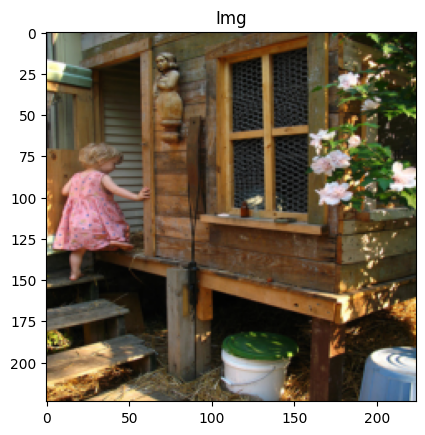

Token:  tensor([  1,   4,  28,   8,   4, 156, 224,  17,  32,  61,   4, 297,  11, 613,
          8,  24,   3, 425,   5,   2])
Sentence: 
['<SOS>', 'a', 'child', 'in', 'a', 'pink', 'dress', 'is', 'climbing', 'up', 'a', 'set', 'of', 'stairs', 'in', 'an', '<UNK>', 'way', '.', '<EOS>']


In [25]:
img, caps = train_dataset[0]
show_image(img, "Img")
print("Token: ", caps)
print("Sentence: ")
print([train_dataset.vocab.int_to_str[token] for token in caps.tolist()])

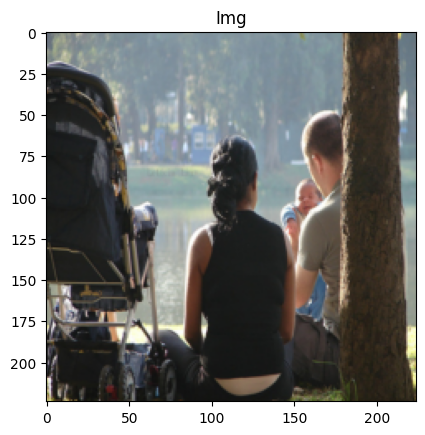

Token:  tensor([  1,   4,  16,   8,  25,   3,  19, 346, 762,  49,   6, 595,  19,  12,
         51,  26,   4, 165,  11,   4,  64,  49, 968,   5,   2])
Sentence: 
['<SOS>', 'a', 'couple', 'and', 'an', '<UNK>', ',', 'being', 'held', 'by', 'the', 'male', ',', 'sitting', 'next', 'to', 'a', 'pond', 'with', 'a', 'near', 'by', 'stroller', '.', '<EOS>']


In [26]:
img, caps = test_dataset[0]
show_image(img, "Img")
print("Token: ", caps)
print("Sentence: ")
print([test_dataset.vocab.int_to_str[token] for token in caps.tolist()])

# Collate class for Dataloader


In [27]:
class capsCollate:
  """
  Apply padding to captions with less length
  """
  def __init__(self, pad_idx, batch_first=False):
    self.pad_idx = pad_idx  # index of <PAD> token in our vocabulary
    self.batch_first = batch_first  # whether image is batch_size,C,H,W or C,H,W,batch_size

  def __call__(self, batch):
    imgs = [item[0].unsqueeze(0) for item in batch]    # Adding an extra dimension (batch) to the images
    imgs = torch.cat(imgs, dim=0)   # Stacking the images across the 'batch' dimension

    targets = [item[1] for item in batch]   # Extracting captions
    targets = pad_sequence(targets, batch_first=self.batch_first, padding_value=self.pad_idx) # Adding padding to the captions

    return imgs, targets

# Train and test dataloaders

In [28]:
BATCH_SIZE = 4
NUM_WORKER = 1

pad_idx = train_dataset.vocab.str_to_int["<PAD>"]

train_dataloader = DataLoader(
    dataset=train_dataset,
    batch_size=BATCH_SIZE,
    num_workers=NUM_WORKER,
    shuffle=True,
    collate_fn=capsCollate(pad_idx=pad_idx, batch_first=True)
)

test_dataloader = DataLoader(
    dataset=test_dataset,
    batch_size=BATCH_SIZE,
    num_workers=NUM_WORKER,
    shuffle=True,
    collate_fn=capsCollate(pad_idx=pad_idx, batch_first=True)
)

train_dataloader, test_dataloader

(<torch.utils.data.dataloader.DataLoader at 0x7e219e8b8a90>,
 <torch.utils.data.dataloader.DataLoader at 0x7e219e90b430>)

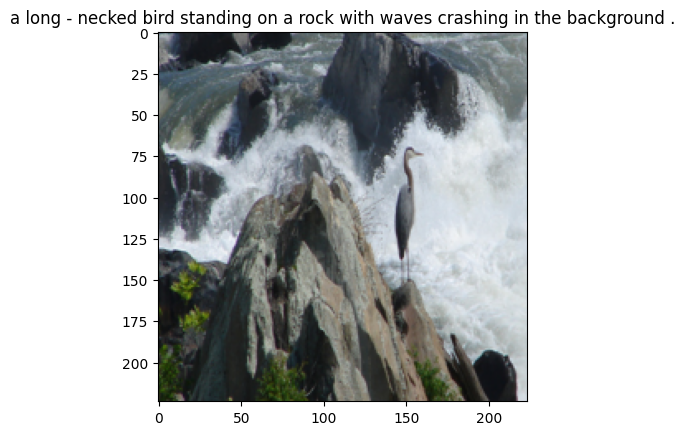

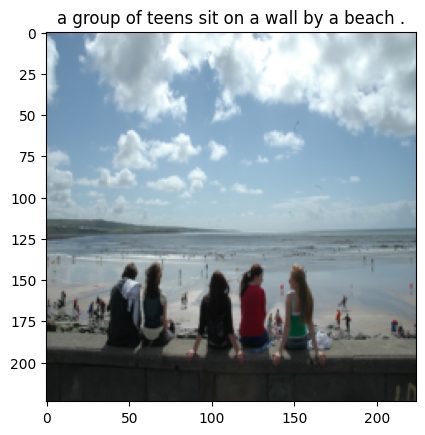

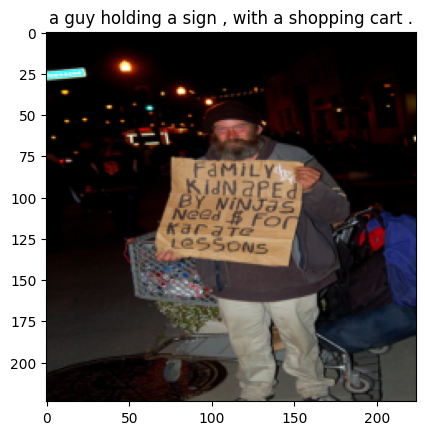

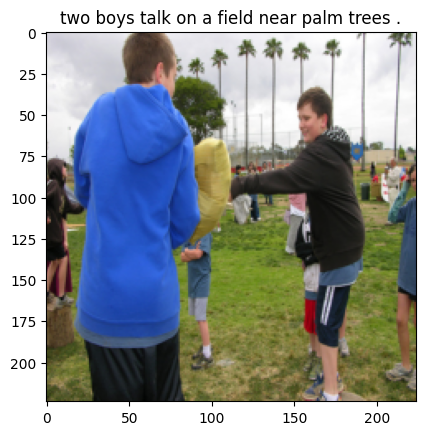

In [29]:
# Getting an iterator
dataiter = iter(train_dataloader)

# Taking the first batch
batch = next(dataiter)

imgs, caps = batch

for i in range(BATCH_SIZE):
  img, cap = imgs[i], caps[i]
  caption_label = [train_dataset.vocab.int_to_str[token] for token in cap.tolist()]
  eos_index = caption_label.index('<EOS>')
  caption_label = caption_label[1:eos_index]
  caption_label = " ".join(caption_label)
  show_image(img, caption_label)
  plt.show()

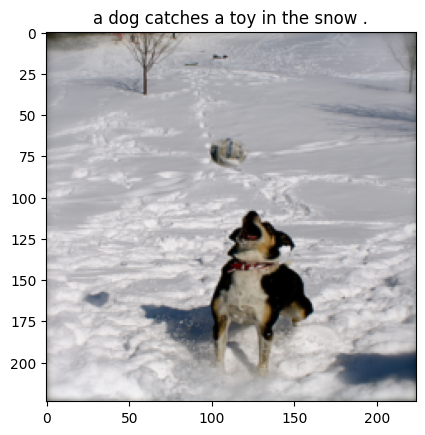

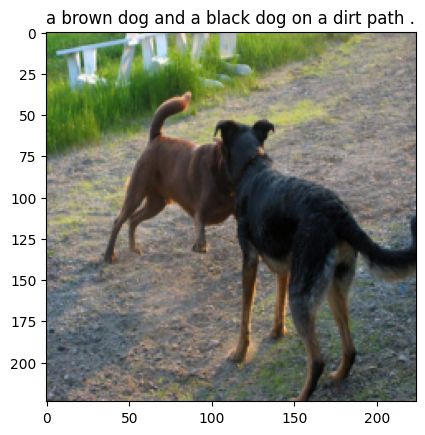

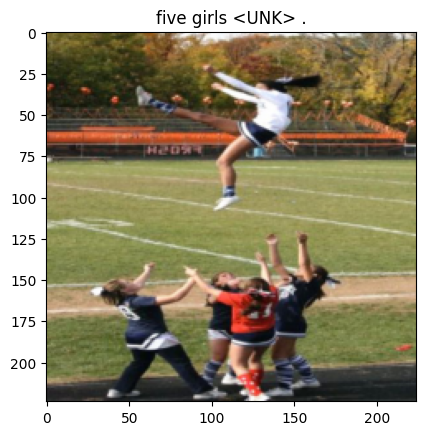

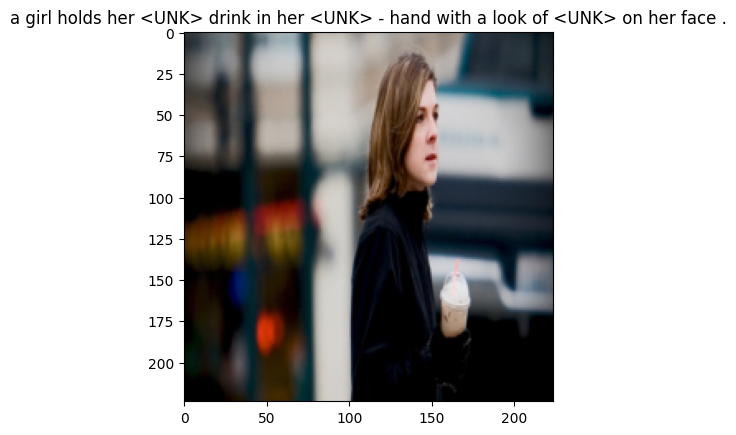

In [30]:
  # Getting an iterator
dataiter = iter(test_dataloader)

# Taking the first batch
batch = next(dataiter)

imgs, caps = batch

for i in range(BATCH_SIZE):
    img, cap = imgs[i], caps[i]
    caption_label = [test_dataset.vocab.int_to_str[token] for token in cap.tolist()]
    eos_index = caption_label.index('<EOS>')
    caption_label = caption_label[1:eos_index]
    caption_label = " ".join(caption_label)
    show_image(img, caption_label)
    plt.show()

In [31]:
def show_image(img, title=None):
    """Imshow for Tensor."""

    #unnormalize
    img[0] = img[0] * 0.229
    img[1] = img[1] * 0.224
    img[2] = img[2] * 0.225
    img[0] += 0.485
    img[1] += 0.456
    img[2] += 0.406

    img = img.numpy().transpose((1, 2, 0))


    plt.imshow(img)
    if title is not None:
        plt.title(title)
    plt.pause(0.001)  # pause a bit so that plots are updated

In [32]:
BATCH_SIZE=256
NUM_WORKER=2

img_transforms = transforms.Compose([
    transforms.Resize(256),
    transforms.RandomCrop(224),
    transforms.ToTensor(),
    transforms.Normalize((0.485, 0.456, 0.406), (0.229, 0.224, 0.225))  # values of normalization as used in ImageNet dataset - so models like ResNet, VGG perform better with this type of normalization rather than just dividing by 255.0. First tuple shows mean of RGB channels and second tuple shows standard deviation of the same
])

In [33]:
train_dataset = FlickrDataset(
    root_dir = os.path.join(train_dir, "images"),
    captions_file = os.path.join(train_dir, "captions.txt"),
    transform = img_transforms
)

test_dataset = FlickrDataset(
    root_dir = os.path.join(test_dir, "images"),
    captions_file = os.path.join(test_dir, "captions.txt"),
    transform = img_transforms
)

In [34]:
train_dataloader = DataLoader(
    dataset=train_dataset,
    batch_size=BATCH_SIZE,
    num_workers=NUM_WORKER,
    shuffle=True,
    collate_fn=capsCollate(pad_idx=pad_idx, batch_first=True)
)

test_dataloader = DataLoader(
    dataset=test_dataset,
    batch_size=BATCH_SIZE,
    num_workers=NUM_WORKER,
    shuffle=True,
    collate_fn=capsCollate(pad_idx=pad_idx, batch_first=True)
)

# Baseline Model Architecture

In [35]:
class EncoderCNN(nn.Module):
  def __init__(self, embed_size):
    super(EncoderCNN, self).__init__()
    resnet = models.resnet50(pretrained=True)  # Getting the pre-trained ResNet50
    for param in resnet.parameters():
      param.requires_grad_(False)          # setting all parameters untrainable

    modules = list(resnet.children())[:-1]   # Removing the last 1000 dimension original image net dense layer and storing remaining layers in a list
    self.resnet = nn.Sequential(*modules)    # Emptying the list element wise into the sequential nn
    self.embed = nn.Linear(resnet.fc.in_features, embed_size)   # changing the output 2048 dimension embeddings of resnet into same dimension as embed_size that Decoder will take as input

  def forward(self, images):
    features = self.resnet(images)   # Extracting features from images
    features = features.view(features.size(0), -1)   # Removes excessive dimensions
    features = self.embed(features)
    return features

In [36]:
class DecoderRNN(nn.Module):
  def __init__(self, embed_size, hidden_size, vocab_size, num_layers=1, drop_prob=0.3):
    super().__init__()
    self.embedding = nn.Embedding(vocab_size, embed_size)    # Embedding layer is a lookup table that stores embeddings of a fixed dictionary and size where number of embddings = length of dictionary = vocab size and dimensions of embedding = embed_size
    self.lstm = nn.LSTM(embed_size, hidden_size, num_layers=num_layers, batch_first=True)  # A LSTM layer
    self.fcn = nn.Linear(hidden_size, vocab_size)
    self.drop = nn.Dropout(drop_prob)

  def forward(self, features, captions):
    embeds = self.embedding(captions[:, :-1])  # Removing the <EOS> token
    x = torch.cat((features.unsqueeze(1), embeds), dim=1)  # Concatenating the features extracted from image with the caption
    x, _ = self.lstm(x)
    x = self.fcn(x)
    return x

  def generate_caption(self, inputs, hidden=None, max_len=20, vocab=None):
    """Inference part - Given the image, generate captions"""
    batch_size=inputs.size(0)
    captions=[]

    for i in range(max_len):     # Maximum length of caption
      output, hidden = self.lstm(inputs, hidden)
      output = self.fcn(output)
      output = output.view(batch_size, -1)

      predicted_word_idx = output.argmax(dim=1)   # Selecting the word with highest probability

      captions.append(predicted_word_idx.item())

      if vocab.int_to_str[predicted_word_idx.item()] == "<EOS>":    # Stopping if an <EOS> token is encountered
        break

      inputs = self.embedding(predicted_word_idx.unsqueeze(0))

    return [vocab.int_to_str[idx] for idx in captions]

In [37]:
class EncoderDecoder(nn.Module):
  def __init__(self, embed_size, hidden_size, vocab_size, num_layers=1, drop_prob=0.3):
    super().__init__()
    self.encoder = EncoderCNN(embed_size)
    self.decoder = DecoderRNN(embed_size, hidden_size, vocab_size, num_layers, drop_prob)

  def forward(self, images, captions):
    features=self.encoder(images)
    outputs=self.decoder(features, captions)
    return outputs

In [38]:
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
device

device(type='cuda')

## Setting hyperparameters and instantiating the model


In [39]:
# Hyperparameters
embed_size=400
hidden_size=512
vocab_size=len(train_dataset.vocab)
num_layers=2
learning_rate=0.0001
num_epochs=2

In [40]:
# Initialize the model, loss, etc
model = EncoderDecoder(embed_size, hidden_size, vocab_size, num_layers).to(device)
loss_fn = nn.CrossEntropyLoss(ignore_index=train_dataset.vocab.str_to_int['<PAD>'])
optimizer = optim.Adam(model.parameters(), lr=learning_rate)

/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/resnet50-0676ba61.pth" to /root/.cache/torch/hub/checkpoints/resnet50-0676ba61.pth
100%|██████████| 97.8M/97.8M [00:00<00:00, 191MB/s]


In [41]:
bleu_metric = BLEUScore(n_gram=1, smooth=True)
rouge_metric = ROUGEScore()

## Model Training

  0%|          | 0/40 [00:00<?, ?it/s]


Epoch: 0
-----


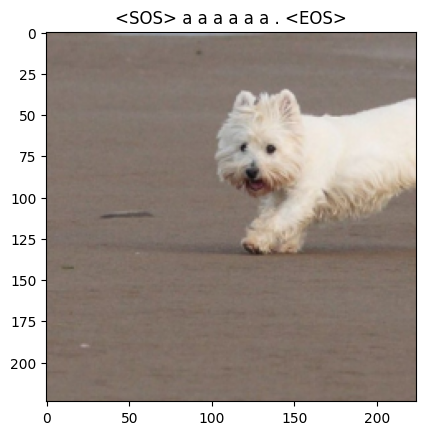

  2%|▎         | 1/40 [02:35<1:40:45, 155.01s/it]


Train Loss: 5.4454 | Train BLEU: 0.1886 | Train ROUGE-L: 0.2442

Test Loss: 4.7292 | Test BLEU: 0.2817 | Test ROUGE-L: 0.3412

Epoch: 1
-----


  5%|▌         | 2/40 [05:07<1:37:14, 153.53s/it]


Train Loss: 4.2292 | Train BLEU: 0.2697 | Train ROUGE-L: 0.3717

Test Loss: 4.6859 | Test BLEU: 0.2072 | Test ROUGE-L: 0.3193

Epoch: 2
-----


  8%|▊         | 3/40 [07:42<1:35:09, 154.32s/it]


Train Loss: 3.9108 | Train BLEU: 0.2100 | Train ROUGE-L: 0.3805

Test Loss: 4.8359 | Test BLEU: 0.1862 | Test ROUGE-L: 0.3483

Epoch: 3
-----


 10%|█         | 4/40 [10:18<1:32:57, 154.93s/it]


Train Loss: 3.6719 | Train BLEU: 0.1812 | Train ROUGE-L: 0.3455

Test Loss: 4.9984 | Test BLEU: 0.1619 | Test ROUGE-L: 0.3298

Epoch: 4
-----


 12%|█▎        | 5/40 [12:57<1:31:15, 156.43s/it]


Train Loss: 3.4950 | Train BLEU: 0.1757 | Train ROUGE-L: 0.3402

Test Loss: 5.1466 | Test BLEU: 0.1563 | Test ROUGE-L: 0.3186

Epoch: 5
-----


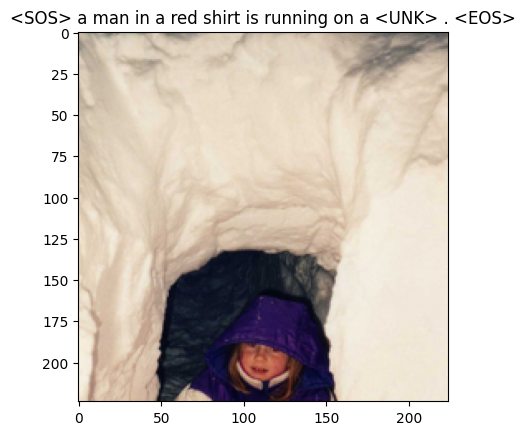

 15%|█▌        | 6/40 [15:40<1:29:46, 158.44s/it]


Train Loss: 3.3668 | Train BLEU: 0.1729 | Train ROUGE-L: 0.3476

Test Loss: 5.2791 | Test BLEU: 0.1766 | Test ROUGE-L: 0.3463

Epoch: 6
-----


 18%|█▊        | 7/40 [18:19<1:27:24, 158.92s/it]


Train Loss: 3.2662 | Train BLEU: 0.1747 | Train ROUGE-L: 0.3436

Test Loss: 5.3681 | Test BLEU: 0.1628 | Test ROUGE-L: 0.3620

Epoch: 7
-----


 20%|██        | 8/40 [21:04<1:25:38, 160.59s/it]


Train Loss: 3.1737 | Train BLEU: 0.1674 | Train ROUGE-L: 0.3466

Test Loss: 5.4605 | Test BLEU: 0.1779 | Test ROUGE-L: 0.3333

Epoch: 8
-----


 22%|██▎       | 9/40 [23:44<1:22:54, 160.48s/it]


Train Loss: 3.0912 | Train BLEU: 0.1816 | Train ROUGE-L: 0.3560

Test Loss: 5.5603 | Test BLEU: 0.1656 | Test ROUGE-L: 0.3403

Epoch: 9
-----


 25%|██▌       | 10/40 [26:30<1:21:10, 162.34s/it]


Train Loss: 3.0210 | Train BLEU: 0.1835 | Train ROUGE-L: 0.3477

Test Loss: 5.6170 | Test BLEU: 0.1619 | Test ROUGE-L: 0.3487

Epoch: 10
-----


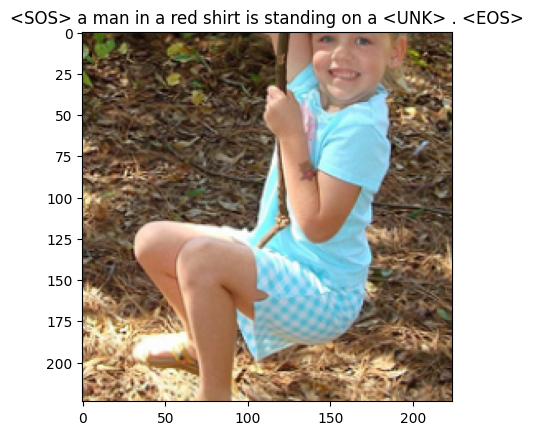

 28%|██▊       | 11/40 [29:18<1:19:18, 164.10s/it]


Train Loss: 2.9591 | Train BLEU: 0.1761 | Train ROUGE-L: 0.3538

Test Loss: 5.6898 | Test BLEU: 0.1775 | Test ROUGE-L: 0.3396

Epoch: 11
-----


 30%|███       | 12/40 [32:04<1:16:50, 164.65s/it]


Train Loss: 2.9014 | Train BLEU: 0.1786 | Train ROUGE-L: 0.3556

Test Loss: 5.7621 | Test BLEU: 0.1612 | Test ROUGE-L: 0.2883

Epoch: 12
-----


 32%|███▎      | 13/40 [34:49<1:14:07, 164.73s/it]


Train Loss: 2.8462 | Train BLEU: 0.1679 | Train ROUGE-L: 0.3319

Test Loss: 5.8278 | Test BLEU: 0.1577 | Test ROUGE-L: 0.3019

Epoch: 13
-----


 35%|███▌      | 14/40 [37:33<1:11:18, 164.57s/it]


Train Loss: 2.7964 | Train BLEU: 0.1662 | Train ROUGE-L: 0.3264

Test Loss: 5.8972 | Test BLEU: 0.1569 | Test ROUGE-L: 0.2668

Epoch: 14
-----


 38%|███▊      | 15/40 [40:22<1:09:02, 165.70s/it]


Train Loss: 2.7501 | Train BLEU: 0.1588 | Train ROUGE-L: 0.3124

Test Loss: 5.9522 | Test BLEU: 0.1621 | Test ROUGE-L: 0.2832

Epoch: 15
-----


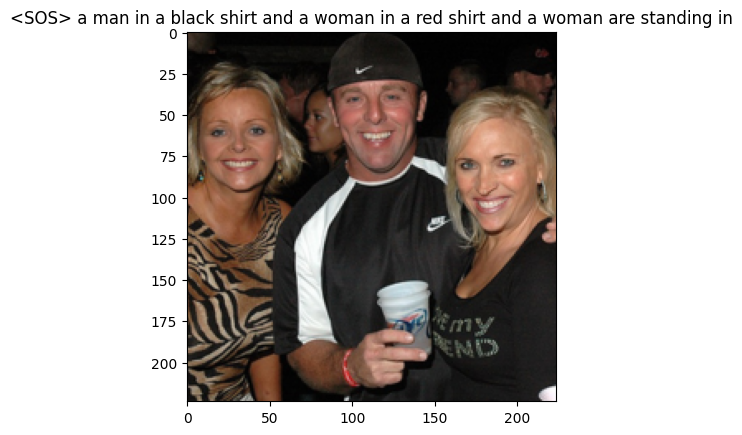

 40%|████      | 16/40 [43:16<1:07:17, 168.25s/it]


Train Loss: 2.7082 | Train BLEU: 0.1660 | Train ROUGE-L: 0.3144

Test Loss: 6.0072 | Test BLEU: 0.1705 | Test ROUGE-L: 0.3414

Epoch: 16
-----


 42%|████▎     | 17/40 [46:05<1:04:36, 168.54s/it]


Train Loss: 2.6699 | Train BLEU: 0.1596 | Train ROUGE-L: 0.3255

Test Loss: 6.0529 | Test BLEU: 0.1590 | Test ROUGE-L: 0.2759

Epoch: 17
-----


 45%|████▌     | 18/40 [48:56<1:02:04, 169.31s/it]


Train Loss: 2.6317 | Train BLEU: 0.1616 | Train ROUGE-L: 0.3126

Test Loss: 6.1254 | Test BLEU: 0.1571 | Test ROUGE-L: 0.2916

Epoch: 18
-----


 48%|████▊     | 19/40 [51:50<59:42, 170.61s/it]  


Train Loss: 2.5991 | Train BLEU: 0.1641 | Train ROUGE-L: 0.2984

Test Loss: 6.1281 | Test BLEU: 0.1662 | Test ROUGE-L: 0.2740

Epoch: 19
-----


 50%|█████     | 20/40 [54:42<56:58, 170.91s/it]


Train Loss: 2.5672 | Train BLEU: 0.1693 | Train ROUGE-L: 0.3028

Test Loss: 6.1733 | Test BLEU: 0.1500 | Test ROUGE-L: 0.2729

Epoch: 20
-----


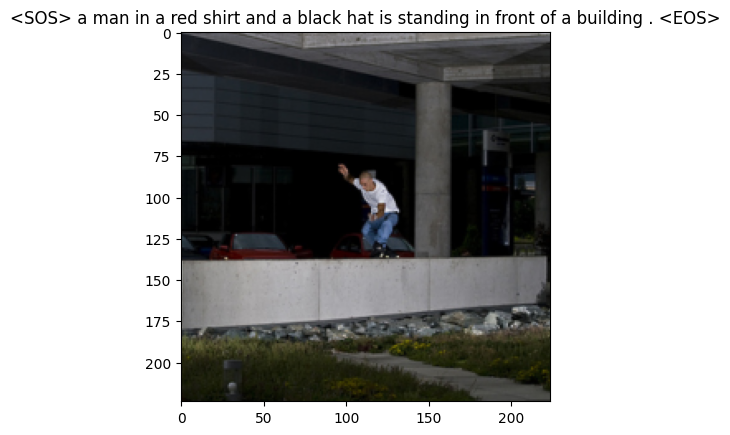

 52%|█████▎    | 21/40 [57:39<54:42, 172.77s/it]


Train Loss: 2.5370 | Train BLEU: 0.1566 | Train ROUGE-L: 0.3112

Test Loss: 6.2630 | Test BLEU: 0.1587 | Test ROUGE-L: 0.3018

Epoch: 21
-----


 55%|█████▌    | 22/40 [1:00:35<52:09, 173.87s/it]


Train Loss: 2.5093 | Train BLEU: 0.1671 | Train ROUGE-L: 0.2951

Test Loss: 6.2746 | Test BLEU: 0.1603 | Test ROUGE-L: 0.2796

Epoch: 22
-----


 57%|█████▊    | 23/40 [1:03:31<49:24, 174.36s/it]


Train Loss: 2.4832 | Train BLEU: 0.1635 | Train ROUGE-L: 0.3207

Test Loss: 6.3204 | Test BLEU: 0.1597 | Test ROUGE-L: 0.3079

Epoch: 23
-----


 60%|██████    | 24/40 [1:06:26<46:32, 174.55s/it]


Train Loss: 2.4565 | Train BLEU: 0.1584 | Train ROUGE-L: 0.2846

Test Loss: 6.3582 | Test BLEU: 0.1594 | Test ROUGE-L: 0.3202

Epoch: 24
-----


 62%|██████▎   | 25/40 [1:09:19<43:31, 174.11s/it]


Train Loss: 2.4334 | Train BLEU: 0.1590 | Train ROUGE-L: 0.2957

Test Loss: 6.4012 | Test BLEU: 0.1610 | Test ROUGE-L: 0.3049

Epoch: 25
-----


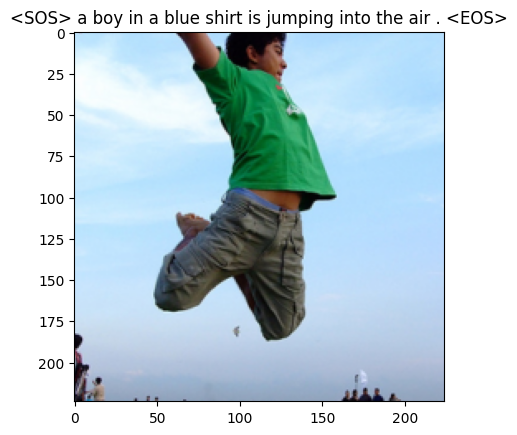

 65%|██████▌   | 26/40 [1:12:19<41:03, 175.98s/it]


Train Loss: 2.4084 | Train BLEU: 0.1580 | Train ROUGE-L: 0.2977

Test Loss: 6.4278 | Test BLEU: 0.1655 | Test ROUGE-L: 0.3038

Epoch: 26
-----


 68%|██████▊   | 27/40 [1:15:19<38:21, 177.05s/it]


Train Loss: 2.3850 | Train BLEU: 0.1706 | Train ROUGE-L: 0.3148

Test Loss: 6.4491 | Test BLEU: 0.1591 | Test ROUGE-L: 0.2795

Epoch: 27
-----


 70%|███████   | 28/40 [1:18:16<35:27, 177.29s/it]


Train Loss: 2.3643 | Train BLEU: 0.1576 | Train ROUGE-L: 0.2987

Test Loss: 6.5014 | Test BLEU: 0.1612 | Test ROUGE-L: 0.3124

Epoch: 28
-----


 72%|███████▎  | 29/40 [1:21:18<32:44, 178.62s/it]


Train Loss: 2.3420 | Train BLEU: 0.1561 | Train ROUGE-L: 0.2971

Test Loss: 6.5264 | Test BLEU: 0.1561 | Test ROUGE-L: 0.2870

Epoch: 29
-----


 75%|███████▌  | 30/40 [1:24:23<30:05, 180.54s/it]


Train Loss: 2.3204 | Train BLEU: 0.1657 | Train ROUGE-L: 0.3106

Test Loss: 6.5455 | Test BLEU: 0.1772 | Test ROUGE-L: 0.3209

Epoch: 30
-----


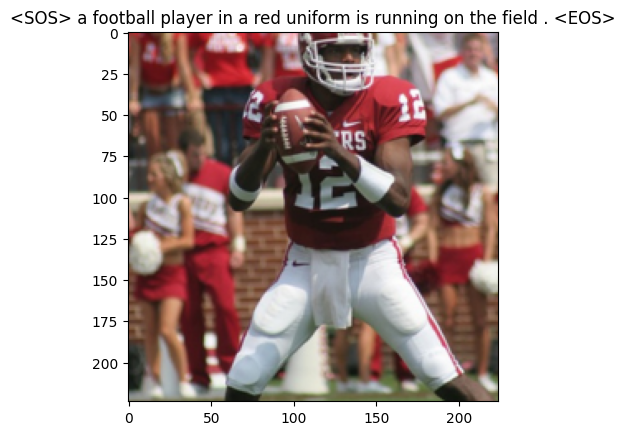

 78%|███████▊  | 31/40 [1:27:33<27:31, 183.48s/it]


Train Loss: 2.3012 | Train BLEU: 0.1610 | Train ROUGE-L: 0.2823

Test Loss: 6.6193 | Test BLEU: 0.1654 | Test ROUGE-L: 0.3021

Epoch: 31
-----


 80%|████████  | 32/40 [1:30:42<24:39, 185.00s/it]


Train Loss: 2.2806 | Train BLEU: 0.1679 | Train ROUGE-L: 0.3039

Test Loss: 6.6471 | Test BLEU: 0.1770 | Test ROUGE-L: 0.2967

Epoch: 32
-----


 82%|████████▎ | 33/40 [1:33:53<21:48, 186.89s/it]


Train Loss: 2.2610 | Train BLEU: 0.1611 | Train ROUGE-L: 0.2760

Test Loss: 6.6647 | Test BLEU: 0.1700 | Test ROUGE-L: 0.3221

Epoch: 33
-----


 85%|████████▌ | 34/40 [1:37:06<18:52, 188.68s/it]


Train Loss: 2.2439 | Train BLEU: 0.1583 | Train ROUGE-L: 0.2946

Test Loss: 6.6782 | Test BLEU: 0.1621 | Test ROUGE-L: 0.2931

Epoch: 34
-----


 88%|████████▊ | 35/40 [1:40:19<15:50, 190.03s/it]


Train Loss: 2.2249 | Train BLEU: 0.1674 | Train ROUGE-L: 0.2814

Test Loss: 6.7237 | Test BLEU: 0.1685 | Test ROUGE-L: 0.2970

Epoch: 35
-----


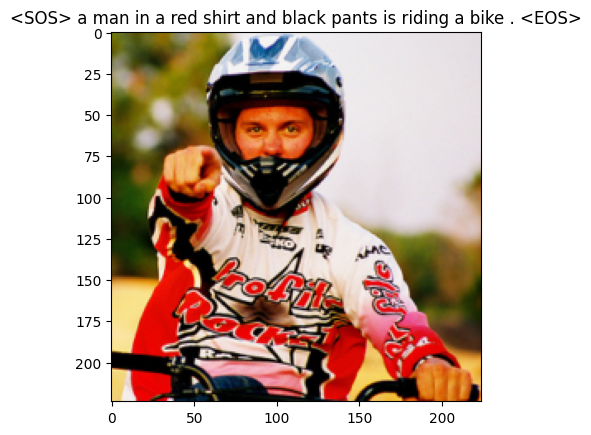

 90%|█████████ | 36/40 [1:43:40<12:53, 193.26s/it]


Train Loss: 2.2058 | Train BLEU: 0.1671 | Train ROUGE-L: 0.2737

Test Loss: 6.7638 | Test BLEU: 0.1517 | Test ROUGE-L: 0.3003

Epoch: 36
-----


 92%|█████████▎| 37/40 [1:46:57<09:43, 194.38s/it]


Train Loss: 2.1890 | Train BLEU: 0.1710 | Train ROUGE-L: 0.3010

Test Loss: 6.7888 | Test BLEU: 0.1646 | Test ROUGE-L: 0.3095

Epoch: 37
-----


 95%|█████████▌| 38/40 [1:50:13<06:29, 194.82s/it]


Train Loss: 2.1710 | Train BLEU: 0.1625 | Train ROUGE-L: 0.2872

Test Loss: 6.8209 | Test BLEU: 0.1579 | Test ROUGE-L: 0.2989

Epoch: 38
-----


 98%|█████████▊| 39/40 [1:53:31<03:15, 195.90s/it]


Train Loss: 2.1542 | Train BLEU: 0.1630 | Train ROUGE-L: 0.2823

Test Loss: 6.8464 | Test BLEU: 0.1663 | Test ROUGE-L: 0.2977

Epoch: 39
-----


100%|██████████| 40/40 [1:56:54<00:00, 175.36s/it]


Train Loss: 2.1375 | Train BLEU: 0.1609 | Train ROUGE-L: 0.2792

Test Loss: 6.9005 | Test BLEU: 0.1766 | Test ROUGE-L: 0.3104


In [42]:
num_epochs = 40
Results = {}
for epoch in tqdm(range(num_epochs)):
  print(f"\nEpoch: {epoch}\n-----")

  model.train()
  train_loss, train_bleu, train_rouge = 0, 0, 0
  for batch, (images, captions) in enumerate(iter(train_dataloader)):
    images, captions = images.to(device), captions.to(device)

    outputs = model(images, captions)

    loss = loss_fn(outputs.view(-1, vocab_size), captions.view(-1))
    train_loss += loss

    optimizer.zero_grad()

    loss.backward()

    optimizer.step()

    with torch.inference_mode():
      features = model.encoder(images[0:1])
      pred_caption = model.decoder.generate_caption(features.unsqueeze(0), vocab=train_dataset.vocab)
      pred_caption_str = ' '.join(pred_caption)

      true_tokens = [train_dataset.vocab.int_to_str[idx.item()] for idx in captions[0] if idx.item() != train_dataset.vocab.str_to_int['<PAD>']]
      true_caption_str = ' '.join(true_tokens)

      bleu_score = bleu_metric(pred_caption_str, true_caption_str).item()  
      train_bleu += bleu_score
      rouge_scores = rouge_metric(pred_caption_str, [true_caption_str])
      train_rouge += rouge_scores["rougeL_fmeasure"].item()
  
  train_loss /= len(train_dataloader)
  train_bleu /= len(train_dataloader)
  train_rouge /= len(train_dataloader)

  test_loss, test_bleu, test_rouge = 0, 0, 0
  model.eval()
  with torch.inference_mode():
    if (epoch%5 == 0):
      dataiter = iter(train_dataloader)
      img, _ = next(dataiter)
      single_image = img[0:1].to(device)
      features = model.encoder(single_image)
      caps = model.decoder.generate_caption(features.unsqueeze(0), vocab=train_dataset.vocab)
      caption = ' '.join(caps)
      show_image(img[0], title=caption)

    for (test_images, test_captions) in iter(test_dataloader):
      test_images, test_captions = test_images.to(device), test_captions.to(device)
      test_outputs = model(test_images, test_captions)
      test_loss += loss_fn(test_outputs.view(-1, vocab_size), test_captions.view(-1)).item()

      test_features = model.encoder(test_images[0:1])
      pred_caption = model.decoder.generate_caption(test_features.unsqueeze(0), vocab=test_dataset.vocab)
      pred_caption_str = ' '.join(pred_caption)

      true_tokens = [test_dataset.vocab.int_to_str[idx.item()] for idx in test_captions[0] if idx.item() != test_dataset.vocab.str_to_int['<PAD>']]
      true_caption_str = ' '.join(true_tokens)

      test_bleu += bleu_metric(pred_caption_str, true_caption_str).item()
      rouge_scores = rouge_metric(pred_caption_str, [true_caption_str])
      test_rouge += rouge_scores["rougeL_fmeasure"].item()
    
    test_loss /= len(test_dataloader)
    test_bleu /= len(test_dataloader)
    test_rouge /= len(test_dataloader)
    
    Results[f"Epoch {epoch}"] = {
        "Train Loss": train_loss.item(), 
        "Train BLEU": train_bleu,
        "Train ROUGE-L": train_rouge,
        "Test Loss": test_loss, 
        "Test BLEU": test_bleu,
        "Test ROUGE-L": test_rouge
    }

  print(f"\nTrain Loss: {train_loss:.4f} | Train BLEU: {train_bleu:.4f} | Train ROUGE-L: {train_rouge:.4f}")
  print(f"\nTest Loss: {test_loss:.4f} | Test BLEU: {test_bleu:.4f} | Test ROUGE-L: {test_rouge:.4f}")

In [43]:
Results

{'Epoch 0': {'Train Loss': 5.4453840255737305,
  'Train BLEU': 0.18864111435108297,
  'Train ROUGE-L': 0.24419243516415123,
  'Test Loss': 4.729238927364349,
  'Test BLEU': 0.2816966474056244,
  'Test ROUGE-L': 0.34124542539939284},
 'Epoch 1': {'Train Loss': 4.229207992553711,
  'Train BLEU': 0.26966990894220005,
  'Train ROUGE-L': 0.37171882484841534,
  'Test Loss': 4.685880169272423,
  'Test BLEU': 0.20719037111848593,
  'Test ROUGE-L': 0.31928832782432437},
 'Epoch 2': {'Train Loss': 3.9108190536499023,
  'Train BLEU': 0.2100369345954084,
  'Train ROUGE-L': 0.38049541214319665,
  'Test Loss': 4.835907489061356,
  'Test BLEU': 0.18620703043416142,
  'Test ROUGE-L': 0.34830072754994035},
 'Epoch 3': {'Train Loss': 3.671940803527832,
  'Train BLEU': 0.18122665631020163,
  'Train ROUGE-L': 0.3455116178576402,
  'Test Loss': 4.998411163687706,
  'Test BLEU': 0.16185661824420094,
  'Test ROUGE-L': 0.3297583293169737},
 'Epoch 4': {'Train Loss': 3.4949533939361572,
  'Train BLEU': 0.17566

## Saving the model and Results

In [44]:
results = pd.DataFrame(Results).T
results.to_csv('results.csv')
res = pd.read_csv('/kaggle/working/results.csv')
res

,Unnamed: 0,Train Loss,Train BLEU,Train ROUGE-L,Test Loss,Test BLEU,Test ROUGE-L
0,Epoch 0,5.445384,0.188641,0.244192,4.729239,0.281697,0.341245
1,Epoch 1,4.229208,0.269670,0.371719,4.685880,0.207190,0.319288
2,Epoch 2,3.910819,0.210037,0.380495,4.835907,0.186207,0.348301
3,Epoch 3,3.671941,0.181227,0.345512,4.998411,0.161857,0.329758
4,Epoch 4,3.494953,0.175666,0.340250,5.146582,0.156349,0.318607
5,Epoch 5,3.366789,0.172921,0.347627,5.279148,0.176552,0.346329
6,Epoch 6,3.266178,0.174704,0.343600,5.368065,0.162795,0.361990
7,Epoch 7,3.173739,0.167434,0.346583,5.460508,0.177858,0.333311
8,Epoch 8,3.091246,0.181588,0.356025,5.560335,0.165566,0.340325
9,Epoch 9,3.021041,0.183494,0.347729,5.616979,0.161937,0.348700


In [45]:
os.makedirs("/kaggle/working/Models", exist_ok=True)
MODEL_PATH = "/kaggle/working/Models"

In [46]:
MODEL_NAME = "baseline_CNN_LSTM.pth"
MODEL_SAVE_PATH = os.path.join(MODEL_PATH, MODEL_NAME)

# Save the model state dict
print(f"Saving model to: {MODEL_SAVE_PATH}")
torch.save(obj=model.state_dict(),
           f=MODEL_SAVE_PATH)

Saving model to: /kaggle/working/Models/baseline_CNN_LSTM.pth


In [47]:
model = EncoderDecoder(embed_size, hidden_size, vocab_size, num_layers).to(device)
model.load_state_dict(torch.load(f=MODEL_SAVE_PATH))
model

/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
<ipython-input-47-ecf65e52678a>:2: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more detail

EncoderDecoder(
  (encoder): EncoderCNN(
    (resnet): Sequential(
      (0): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
      (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): ReLU(inplace=True)
      (3): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
      (4): Sequential(
        (0): Bottleneck(
          (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
          (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
          (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
          (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
          (relu): ReLU(inplace=True)
 

## Trying out the model

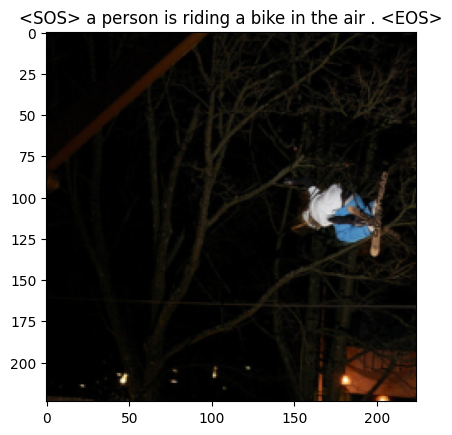

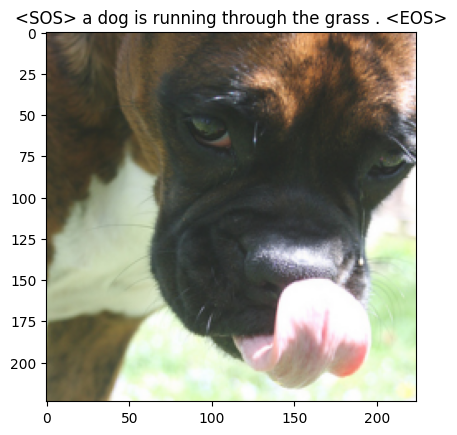

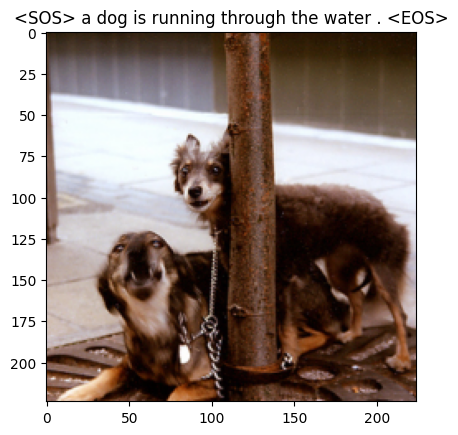

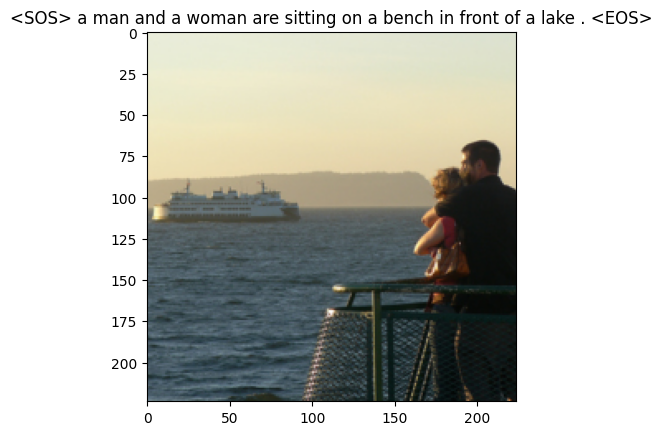

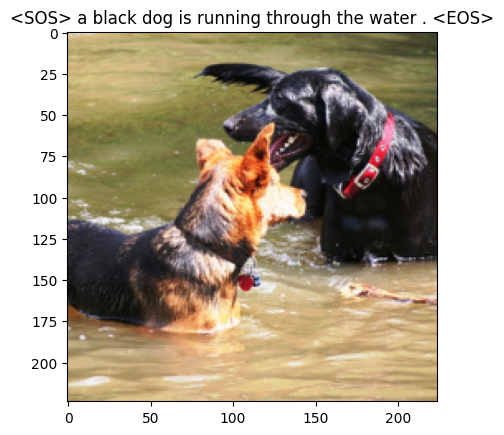

...

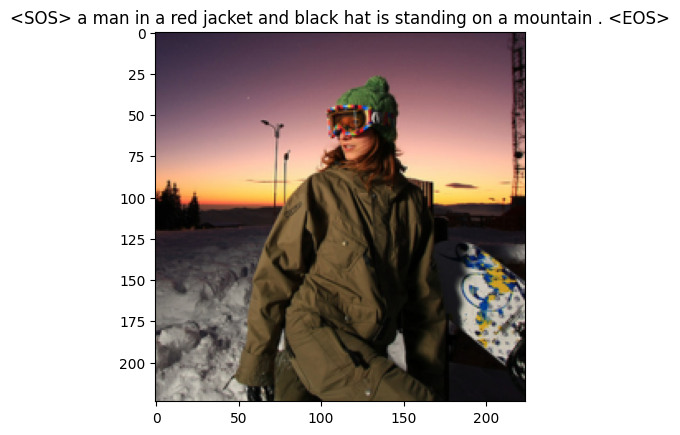

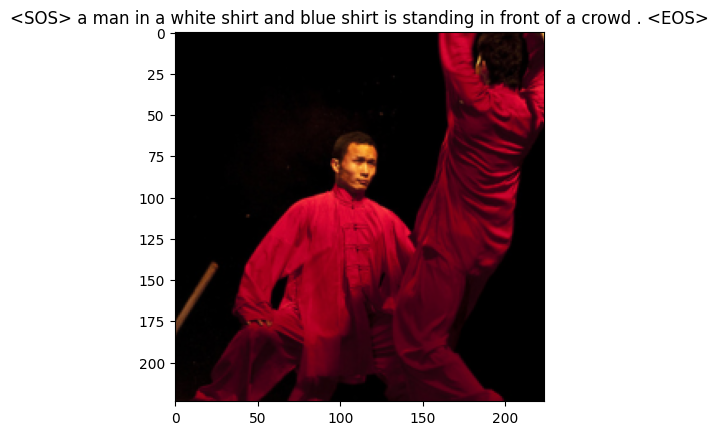

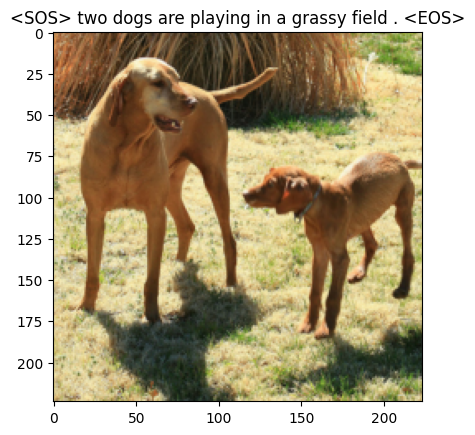

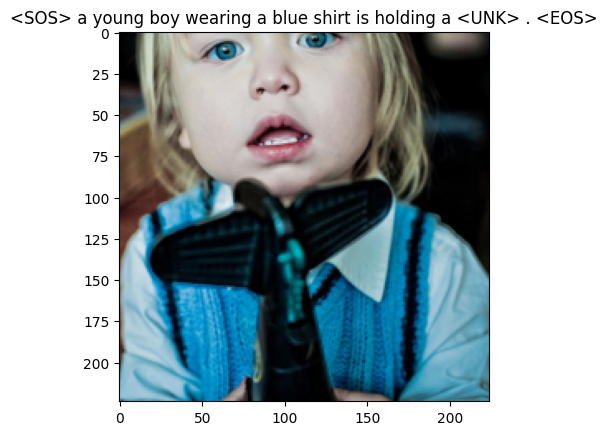

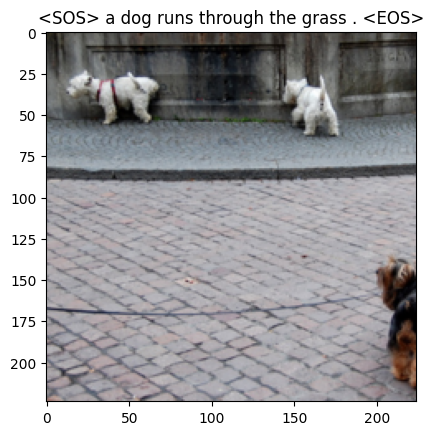

In [48]:
for (image, captions) in iter(test_dataloader):
  model.eval()
  with torch.inference_mode():
    dataiter = iter(test_dataloader)
    img, _ = next(dataiter)
    features = model.encoder(img[0:1].to(device))
    caps = model.decoder.generate_caption(features.unsqueeze(0), vocab=train_dataset.vocab)
    caption = " ".join(caps)
    show_image(img[0], title=caption)